In [ ]:
# Copyright 2024 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Vertex AI Model Garden - ControlNet

Access to the original source notebook in Vertex AI:

<table align="left">
  <td>
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogleCloudPlatform%2Fvertex-ai-samples%2Fmain%2Fnotebooks%2Fcommunity%2Fmodel_garden%2Fmodel_garden_pytorch_controlnet.ipynb">
      <img alt="Google Cloud Colab Enterprise logo" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" width="32px"><br> Run in Colab Enterprise
    </a>
  </td>
  <td>
    <a href="https://github.com/GoogleCloudPlatform/vertex-ai-samples/blob/main/notebooks/community/model_garden/model_garden_pytorch_controlnet.ipynb">
      <img src="https://cloud.google.com/ml-engine/images/github-logo-32px.png" alt="GitHub logo"><br>
      View on GitHub
    </a>
  </td>
</table>

## Overview

This notebook demonstrates deploying the [ControlNet](https://huggingface.co/lllyasviel/ControlNet) model on Vertex AI for redesigning room layouts using different ControlNet Conditionings.

### Objective

- Upload the model to [Model Registry](https://cloud.google.com/vertex-ai/docs/model-registry/introduction).
- Deploy the model on [Endpoint](https://cloud.google.com/vertex-ai/docs/predictions/using-private-endpoints).
- Run online predictions for text-guided-image-to-image.

### Costs

This tutorial uses billable components of Google Cloud:

* Vertex AI
* Cloud Storage

Learn about [Vertex AI pricing](https://cloud.google.com/vertex-ai/pricing) and [Cloud Storage pricing](https://cloud.google.com/storage/pricing), and use the [Pricing Calculator](https://cloud.google.com/products/calculator/) to generate a cost estimate based on your projected usage.

## Run the notebook

In [ ]:
# @title Setup Google Cloud project

# @markdown 1. [Make sure that billing is enabled for your project](https://cloud.google.com/billing/docs/how-to/modify-project).

# @markdown 2. [Optional] [Create a Cloud Storage bucket](https://cloud.google.com/storage/docs/creating-buckets) for storing experiment outputs. Set the BUCKET_URI for the experiment environment. The specified Cloud Storage bucket (`BUCKET_URI`) should be located in the same region as where the notebook was launched. Note that a multi-region bucket (eg. "us") is not considered a match for a single region covered by the multi-region range (eg. "us-central1"). If not set, a unique GCS bucket will be created instead.

import base64
import os
import sys
from datetime import datetime
from io import BytesIO

import cv2
import numpy as np
import requests
from google.cloud import aiplatform
from PIL import Image

# Get the default cloud project id.
PROJECT_ID = os.environ["GOOGLE_CLOUD_PROJECT"]

# Get the default region for launching jobs.
REGION = os.environ["GOOGLE_CLOUD_REGION"]

# Enable the Vertex AI API and Compute Engine API, if not already.
! gcloud services enable aiplatform.googleapis.com compute.googleapis.com

# Cloud Storage bucket for storing the experiment artifacts.
# A unique GCS bucket will be created for the purpose of this notebook. If you
# prefer using your own GCS bucket, please change the value yourself below.
now = datetime.now().strftime("%Y%m%d%H%M%S")
BUCKET_URI = ""  # @param {type: "string"}
BUCKET_NAME = "/".join(BUCKET_URI.split("/")[:3])
assert BUCKET_URI.startswith("gs://"), "BUCKET_URI must start with `gs://`."

# Create a unique GCS bucket for this notebook, if not specified by the user.
if BUCKET_URI is None or BUCKET_URI.strip() == "" or BUCKET_URI == "gs://":
    BUCKET_URI = f"gs://{PROJECT_ID}-tmp-{now}"
    ! gsutil mb -l {REGION} {BUCKET_URI}
else:
    shell_output = ! gsutil ls -Lb {BUCKET_NAME} | grep "Location constraint:" | sed "s/Location constraint://"
    bucket_region = shell_output[0].strip().lower()
    if bucket_region != REGION:
        raise ValueError(
            "Bucket region %s is different from notebook region %s."
            % (bucket_region, REGION)
        )

print(f"Using this GCS Bucket: {BUCKET_URI}")

# Set up the default SERVICE_ACCOUNT.
SERVICE_ACCOUNT = None
shell_output = ! gcloud projects describe $PROJECT_ID
project_number = shell_output[-1].split(":")[1].strip().replace("'", "")
SERVICE_ACCOUNT = f"{project_number}-compute@developer.gserviceaccount.com"

print("Using this default Service Account:", SERVICE_ACCOUNT)

# Provision permissions to the SERVICE_ACCOUNT with the GCS bucket
BUCKET_NAME = "/".join(BUCKET_URI.split("/")[:3])
! gsutil iam ch serviceAccount:{SERVICE_ACCOUNT}:roles/storage.admin $BUCKET_NAME

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user(project_id=PROJECT_ID)

# The pre-built training docker image. It contains training scripts and models.
TRAIN_DOCKER_URI = "us-docker.pkg.dev/vertex-ai/vertex-vision-model-garden-dockers/pytorch-diffusers-train:latest"

# The pre-built serving docker image. It contains serving scripts and models.
SERVE_DOCKER_URI = "us-docker.pkg.dev/vertex-ai/vertex-vision-model-garden-dockers/pytorch-diffusers-serve-opt:20240403_0836_RC00"


# Define common functions.
def download_image(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content))


def image_to_base64(image, format="JPEG"):
    buffer = BytesIO()
    image.save(buffer, format=format)
    image_str = base64.b64encode(buffer.getvalue()).decode("utf-8")
    return image_str


def base64_to_image(image_str):
    image = Image.open(BytesIO(base64.b64decode(image_str)))
    return image


def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h), color=(255, 255, 255))
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w + 10 * i, i // cols * h))
    return grid


def canny(image):
    image = np.array(image)
    image = cv2.Canny(image, 100, 200)
    image = image[:, :, None]
    image = np.concatenate([image, image, image], axis=2)
    image = Image.fromarray(image)
    return image


def deploy_model(model_id, task, model_name="controlnet"):
    endpoint = aiplatform.Endpoint.create(display_name=f"{model_name}-endpoint")
    serving_env = {
        "MODEL_ID": model_id,
        "TASK": task,
    }
    model = aiplatform.Model.upload(
        display_name=model_name,
        serving_container_image_uri=SERVE_DOCKER_URI,
        serving_container_ports=[7080],
        serving_container_predict_route="/predictions/diffusers_serving",
        serving_container_health_route="/ping",
        serving_container_environment_variables=serving_env,
    )
    model.deploy(
        endpoint=endpoint,
        machine_type="g2-standard-8",
        accelerator_type="NVIDIA_L4",
        accelerator_count=1,
        deploy_request_timeout=1800,
        service_account=SERVICE_ACCOUNT,
    )
    return model, endpoint

In [ ]:
!pip install controlnet_aux

In [ ]:
# @title Upload and deploy model

# @markdown This step deploys the pre-trained [lllyasviel/sd-controlnet-canny](https://huggingface.co/lllyasviel/sd-controlnet-canny) model for the text-guided image-to-image task.

# @markdown The model deployment step will take ~15 minutes to complete.

model_canny, endpoint_canny = deploy_model(
    model_id="lllyasviel/sd-controlnet-canny", task="controlnet", model_name="controlnet-canny"
)

In [ ]:
# @title Upload and deploy model

# @markdown This step deploys the pre-trained [lllyasviel/sd-controlnet-mlsd](https://huggingface.co/lllyasviel/sd-controlnet-canny) model for the text-guided image-to-image task.

# @markdown The model deployment step will take ~15 minutes to complete.

model_mlsd, endpoint_mlsd = deploy_model(
    model_id="lllyasviel/sd-controlnet-mlsd", task="controlnet", model_name="controlnet-mlsd"
)

In [ ]:
# @title Upload and deploy model

# @markdown This step deploys the pre-trained [lllyasviel/sd-controlnet-depth](https://huggingface.co/lllyasviel/sd-controlnet-canny) model for the text-guided image-to-image task.

# @markdown The model deployment step will take ~15 minutes to complete.

model_depth, endpoint_depth = deploy_model(
    model_id="lllyasviel/sd-controlnet-depth", task="controlnet", model_name="controlnet-depth"
)

In [148]:
endpoints = {}
endpoints['depth'] = aiplatform.Endpoint.list(
    filter="display_name=controlnet-depth-endpoint",
)[0]
endpoints['mlsd'] = aiplatform.Endpoint.list(
    filter="display_name=controlnet-mlsd-endpoint",
)[0]
endpoints['canny'] = aiplatform.Endpoint.list(
    filter="display_name=controlnet-canny-endpoint",
)[0]

models = {}

models['depth'] = aiplatform.Model.list(
    filter="display_name=controlnet-depth",
)[0]
models['mlsd'] = aiplatform.Model.list(
    filter="display_name=controlnet-mlsd",
)[0]
models['canny'] = aiplatform.Model.list(
    filter="display_name=controlnet-canny",
)[0]

def display(prompt, image, num_inference_steps, conditioner, predictor, num_outputs):
  if image.startswith("http"):
    init_image = download_image(image)
  else:
    init_image = Image.open(image)

  conditioned_image = conditioner(init_image)
  instances = [
      {
          "prompt": prompt,
          "image": image_to_base64(conditioned_image),
          "num_inference_steps": num_inference_steps,
      },
  ]
  output = []
  for i in range(num_outputs):
      response = predictor.predict(instances=instances)
      images = [base64_to_image(image) for image in response.predictions]
      output.append(images[0])
  return image_grid([init_image, conditioned_image] + output, rows=(len(output) + 1)//2 +1, cols=2)



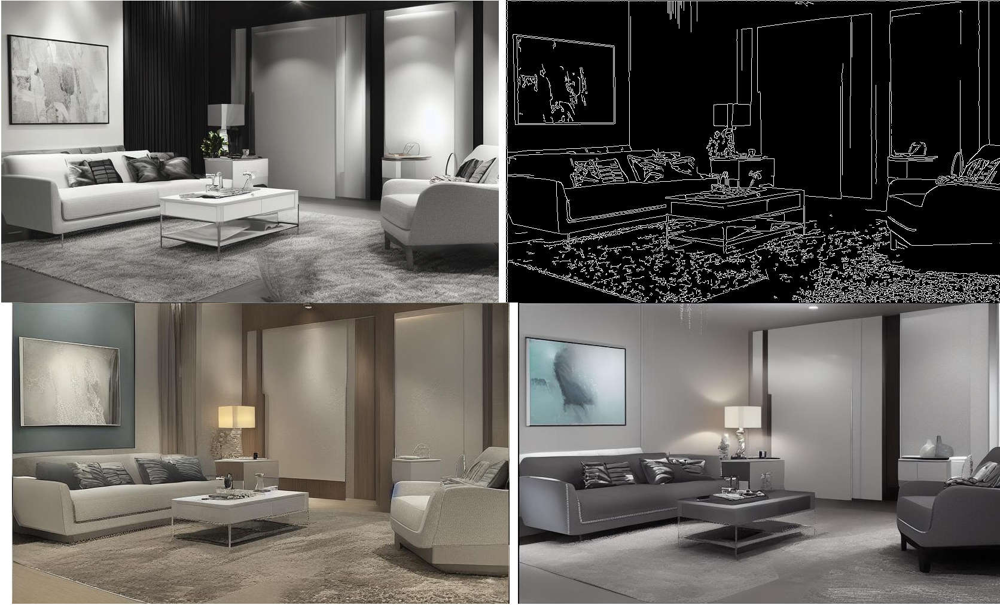

In [135]:
# @title Predict Canny

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and canny image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "(modern), best quality, extremely detailed"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


display(prompt, image, num_inference_steps, canny, endpoints['canny'], num_outputs)

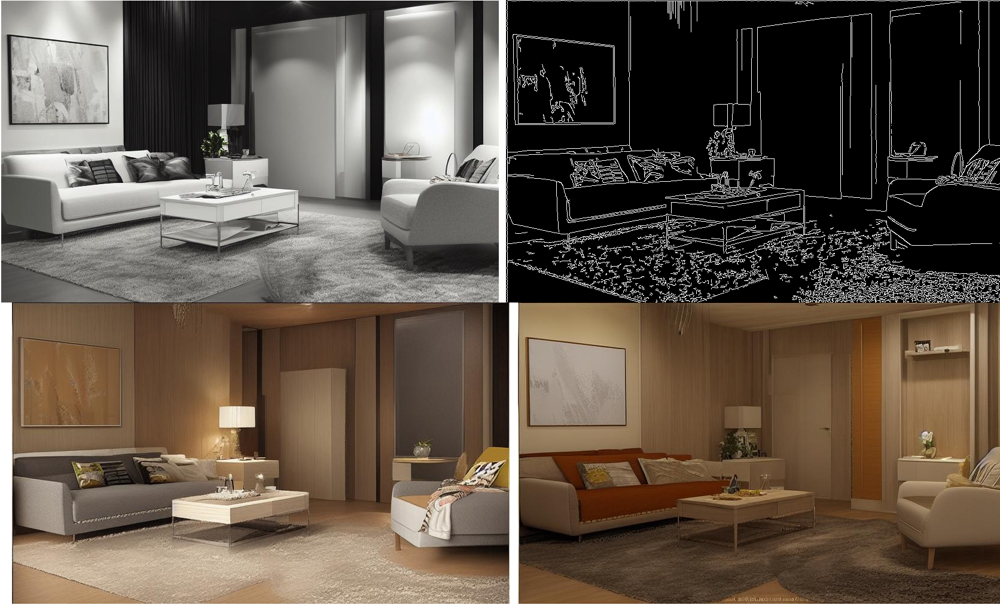

In [136]:
# @title Predict Canny

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and canny image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "wood cabin, cozy , best quality"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}

display(prompt, image, num_inference_steps, canny, endpoints['canny'], num_outputs)

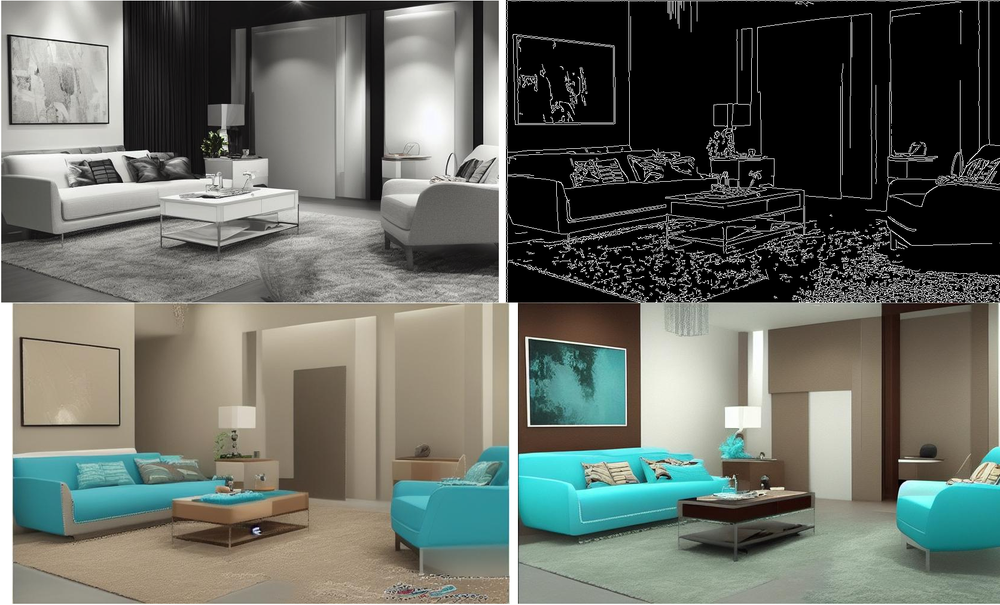

In [139]:
# @title Predict Canny

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and canny image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "clean, simple, turquoise, brown, best quality, extremely detailed"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


display(prompt, image, num_inference_steps, canny, endpoints['canny'], num_outputs)

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extr

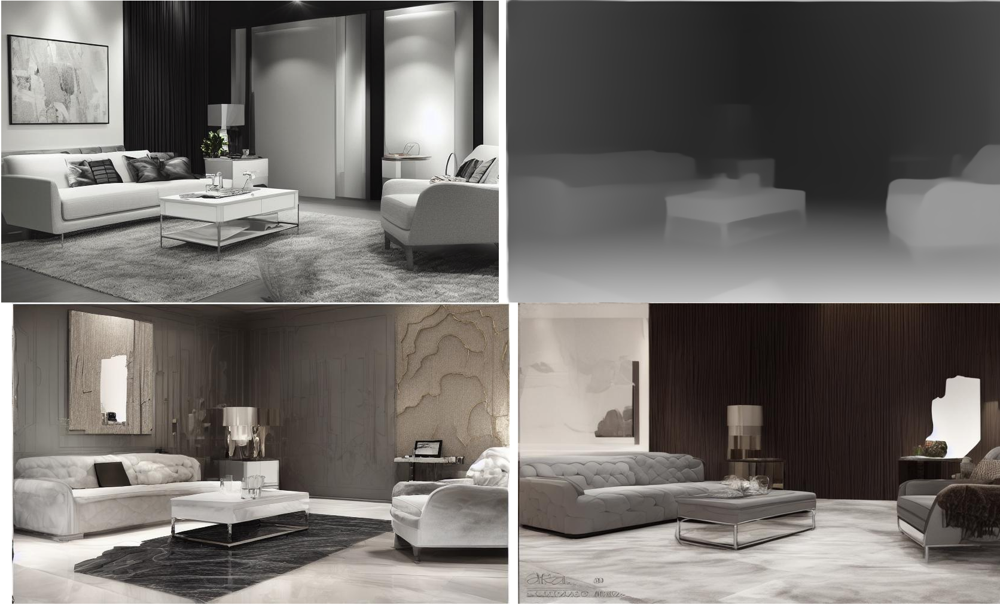

In [142]:
# @title Predict Depth

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and depth image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "chic, modern, best quality, realistic"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


from transformers import pipeline
from PIL import Image
import numpy as np
import torch

def depth(init_image):
  depth_estimator = pipeline('depth-estimation')

  init_image = depth_estimator(init_image)['depth']
  init_image = np.array(init_image)
  init_image = init_image[:, :, None]
  init_image = np.concatenate([init_image, init_image, init_image], axis=2)
  init_image = Image.fromarray(init_image)
  return init_image



display(prompt, image, num_inference_steps, depth, endpoints['depth'], num_outputs)

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extr

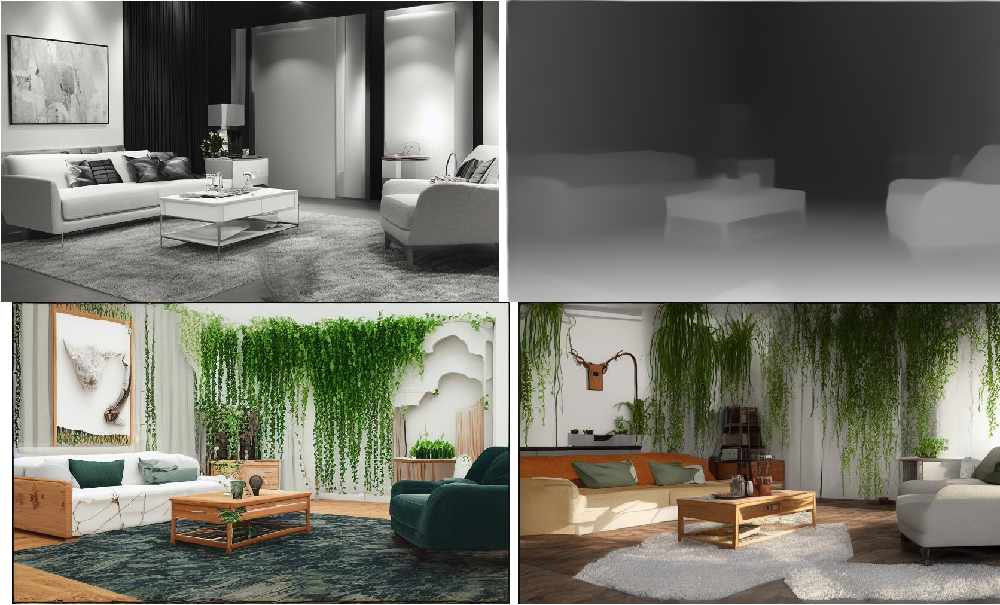

In [144]:
# @title Predict Depth

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and depth image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "cozy room, has plants, best quality, realistic"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


from transformers import pipeline
from PIL import Image
import numpy as np
import torch

def depth(init_image):
  depth_estimator = pipeline('depth-estimation')

  init_image = depth_estimator(init_image)['depth']
  init_image = np.array(init_image)
  init_image = init_image[:, :, None]
  init_image = np.concatenate([init_image, init_image, init_image], axis=2)
  init_image = Image.fromarray(init_image)
  return init_image



display(prompt, image, num_inference_steps, depth, endpoints['depth'], num_outputs)


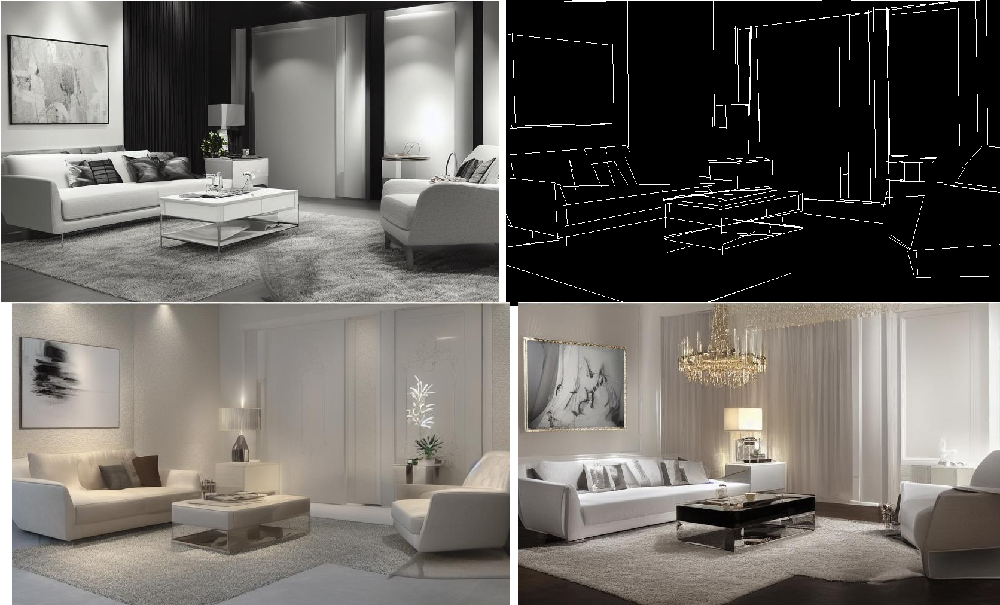

In [145]:
# @title Predict MLSD

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and depth image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "chic, modern, best quality, extremely detailed"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


from PIL import Image
import torch
from controlnet_aux import MLSDdetector

mlsd = MLSDdetector.from_pretrained('lllyasviel/ControlNet')



display(prompt, image, num_inference_steps, mlsd, endpoints['mlsd'], num_outputs)


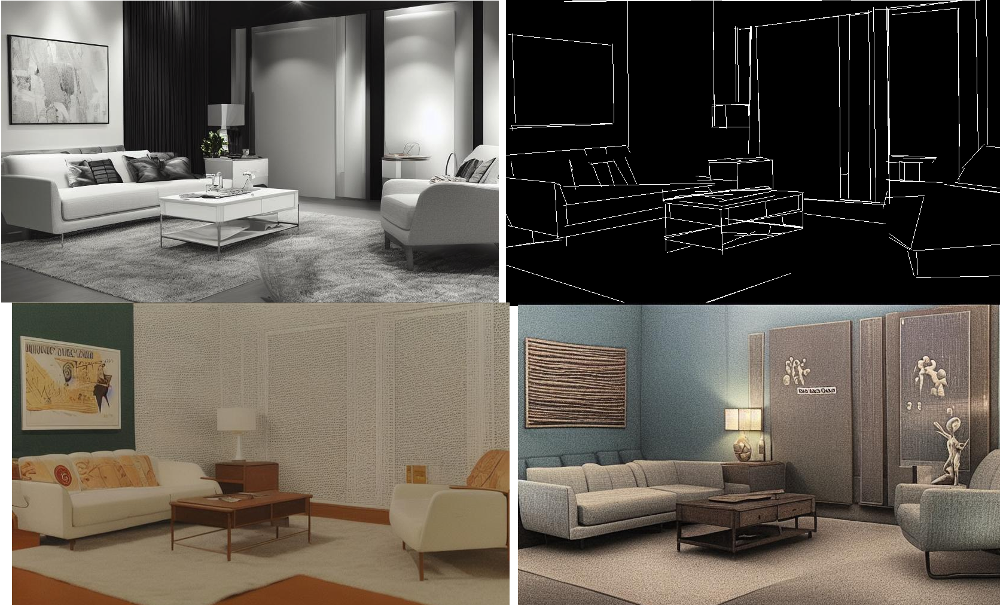

In [146]:
# @title Predict MLSD

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and depth image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.

prompt = "70s,  best quality, extremely detailed, realistic"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}


from PIL import Image
import torch
from controlnet_aux import MLSDdetector

mlsd = MLSDdetector.from_pretrained('lllyasviel/ControlNet')

display(prompt, image, num_inference_steps, mlsd, endpoints['mlsd'], num_outputs)


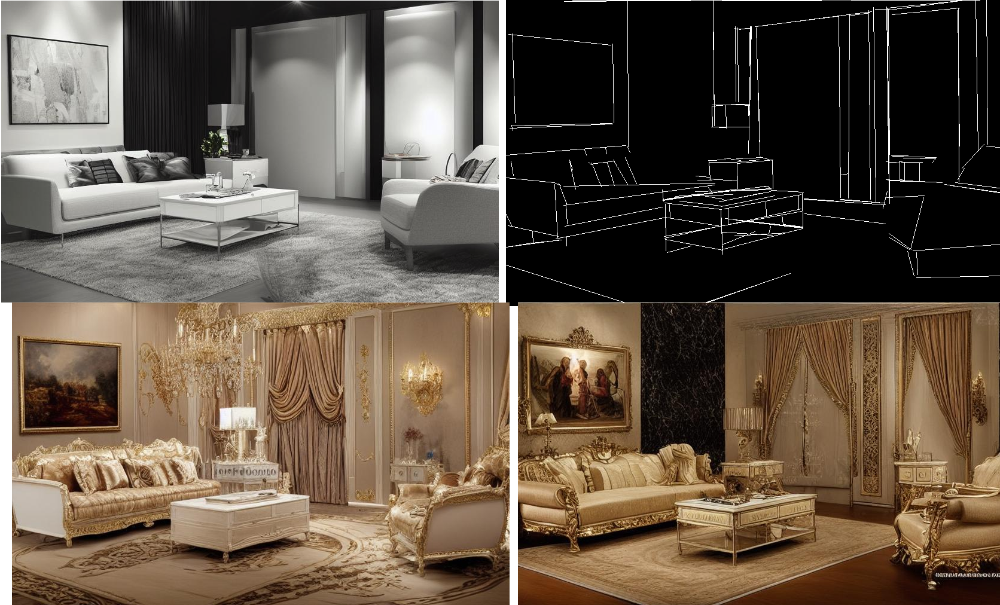

In [147]:
# @title Predict MLSD

# @markdown Once deployment succeeds, you can send requests to the endpoint with text prompt and depth image.

# @markdown When deployed on one L4 GPU (the default machine type), the averaged inference time of a request is ~15 seconds.

# @markdown You may adjust the parameters below to achieve best image quality.



prompt = "neoclassical,  best quality, extremely detailed, realistic"  # @param {type: "string"}
image = "/content/Starting_room.png"  # @param {type: "string"}
num_inference_steps = 25  # @param {type:"number"}
num_outputs = 2  # @param {type:"number"}
# init_image = download_image(image)



from PIL import Image
import torch
from controlnet_aux import MLSDdetector

mlsd = MLSDdetector.from_pretrained('lllyasviel/ControlNet')

display(prompt, image, num_inference_steps, mlsd, endpoints['mlsd'], num_outputs)





In [ ]:
# @title Clean up resources

# @markdown  Delete the experiment models and endpoints to recycle the resources
# @markdown  and avoid unnecessary continouous charges that may incur.

# Undeploy model and delete endpoint.
for endpoint_name in endpoints:
  print(endpoints[endpoint_name])
  endpoints[endpoint_name].delete(force=True)

# Delete models.
for model_name in models:
  print(models[model_name])
  models[model_name].delete()


# Delete bucket.
delete_bucket = False  # @param {type:"boolean"}
if delete_bucket:
    ! gsutil -m rm -r $BUCKET_URI